# Test Unlabeled Spectrograms (Multiclass)

This notebook loads a multiclass classifier and predicts labels for unlabeled spectrograms from `.mat` files. It reports label distributions, per-hydrophone breakdowns, and shows example spectrograms per predicted label and for multi-label cases.


In [1]:
# Auto-reload imported modules so we don't need to restart kernel
%load_ext autoreload
%autoreload 2

# Env check and imports
import sys
import os
import pickle
from pathlib import Path

import numpy as np
import torch
import scipy.io as sio
import h5py
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
import pandas as pd

print(f"Python: {sys.version}")
print(f"CUDA available: {torch.cuda.is_available()}")

# Add src to path
repo_root = Path.cwd().parent
if str(repo_root) not in sys.path:
    sys.path.append(str(repo_root))

from src.ssamba.utilities.training_utils import create_model
from src.ssamba.dataset import ONCSpectrogramDataset
from src.ssamba.utilities.spectrogram_utils import (
    load_mat_spectrogram,
    normalize_spectrogram,
    preprocess_to_tensor,
    preprocess_to_tensor_ctf,
    preprocess_with_resize_ctf,
    resize_to_target,
)
from src.ssamba.utilities.inference_utils import build_mat_dataloader, run_inference_multiclass, build_mat_dataloader_h5like



Python: 3.10.12 (main, Jan 17 2025, 14:35:34) [GCC 11.4.0]
CUDA available: True


/home/sbialek/ONC/selfsupervision_anomalies_onc/.venv/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/home/sbialek/ONC/selfsupervision_anomalies_onc/.venv/lib/python3.10/site-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via timm.models
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.models", FutureWarning)


VisionMamba imported successfully
RMSNorm imported successfully


In [14]:
# Config

# MAT_FILES_DIR = "/mnt/z/CIOOS_Anomaly_detection_work/EndeavourKEMFHH1/testset/ICLISTENHF6324/sampling_2024-11-20_to_2025-06-24/mat/processed/"
# MAT_FILES_DIR = "/mnt/z/CIOOS_Anomaly_detection_work/CambridgeBay/testset/ICLISTENHF1951/sampling_2024-09-04_to_2025-05-31/mat/processed/"
MAT_FILES_DIR = "/mnt/z/CIOOS_Anomaly_detection_work/Burrard_Inlet/testset/ICLISTENHF1354/sampling_2023-11-18_to_2024-01-16/mat/processed"
# MAT_FILES_DIR = "/mnt/z/CIOOS_Anomaly_detection_work/EndeavourKEMFHH1/matfiles/"
MODEL_DIR = Path("/home/sbialek/ONC/selfsupervision_anomalies_onc/data/trained-model/finetune/amba-base-f16-t16-b16-lr1e-4-m300-custom-tr0.8-fir_experiment_multiclass_avgtok2")
CHECKPOINT_PATH = MODEL_DIR / "models/ft-avgtok_best_checkpoint.pth"
OUTPUT_DIR = Path("test_results_multiclass")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

TARGET_SIZE = (512, 512)       # h, w
EXPECTED_SHAPE = (854, 1000)   # raw .mat shape
BATCH_SIZE = 4

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)


Device: cuda


In [3]:
# Load model and derive class names from args/dataset

# Load args.pkl
with open(MODEL_DIR / 'args.pkl', 'rb') as f:
    args = pickle.load(f)

# Make sure multiclass is on
args.multiclass = True

args.exp_dir = MODEL_DIR

# Create and load model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = create_model(args)
model = model.to(device)

# Load checkpoint
checkpoint = torch.load(CHECKPOINT_PATH, map_location=device)
if 'model_state_dict' in checkpoint:
    state_dict = checkpoint['model_state_dict']
else:
    state_dict = checkpoint

model.load_state_dict(state_dict)
model.eval()

# Build a tiny dataset instance to recover label mapping
# Use data path from args if available; otherwise construct from config
probe_data_path = "/home/sbialek/ONC/selfsupervision_anomalies_onc/data/different_locations_incl_backgroundpipelinenormals_multilabel.h5"

probe_ds = ONCSpectrogramDataset(
    data_path=probe_data_path if probe_data_path else str(MODEL_DIR),
    split='test',
    train_ratio=getattr(args, 'train_ratio', 0.8),
    val_ratio=getattr(args, 'val_ratio', 0.1),
    seed=getattr(args, 'split_seed', 42),
    target_length=getattr(args, 'target_length', 1024),
    num_mel_bins=getattr(args, 'num_mel_bins', 128),
    supervised=True,
    subsample_test=False,
    multiclass=True,
    num_classes=getattr(args, 'num_classes', 8),
)
# Trigger mapping
_ = probe_ds[0]
class_names = [probe_ds.index_to_label[i] for i in range(len(probe_ds.index_to_label))]
print("Classes:", class_names)


Vision Mamba Config: {'img_size': (512, 512), 'patch_size': 16, 'stride': 16, 'embed_dim': 768, 'depth': 24, 'channels': 1, 'num_classes': 8, 'drop_rate': 0.0, 'drop_path_rate': 0.1, 'norm_epsilon': 1e-05, 'rms_norm': False, 'residual_in_fp32': False, 'fused_add_norm': False, 'if_rope': False, 'if_rope_residual': False, 'bimamba_type': 'v2', 'if_cls_token': True, 'if_devide_out': True, 'use_double_cls_token': False, 'use_middle_cls_token': False, 'if_bidirectional': True, 'final_pool_type': 'none', 'if_abs_pos_embed': True, 'if_bimamba': False}
Loading pretrained model from: /scratch/merileo/exp/pretrain/amba-base-f16-t16-b16-lr1e-4-m300-custom-tr0.8-full_dataset_hydrophones_FINAL/models/pretrain-joint_best_checkpoint.pth
Loaded state dict keys: dict_keys(['epoch', 'global_step', 'model_state_dict', 'optimizer_state_dict', 'scheduler_state_dict', 'best_metrics', 'val_acc', 'args'])
Now loading SSL pretrained model from /scratch/merileo/exp/pretrain/amba-base-f16-t16-b16-lr1e-4-m300-cus

In [15]:
# collect .mat files
mat_paths = sorted([str(p) for p in Path(MAT_FILES_DIR).glob('**/*.mat')])
print(f"Found {len(mat_paths)} .mat files")

# build dataloader
data_loader = build_mat_dataloader_h5like(
    paths=mat_paths,
    expected_shape=EXPECTED_SHAPE,
    target_size=(512, 512),
    batch_size=BATCH_SIZE,
    num_workers=4,
    dataset_mean=getattr(args, 'dataset_mean', None),
    dataset_std=getattr(args, 'dataset_std', None),
    amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount')
)

Found 1493 .mat files


In [16]:
# run inference
_, preds, probs, sources = run_inference_multiclass(
    model=model,
    data_loader=data_loader,
    device=device,
    task=getattr(args, 'task', 'ft_cls'),
    show_progress=True,
    desc='unlabeled inference'
)

# Build DataFrame of predictions
results = pd.DataFrame({
    'path': mat_paths[:len(preds)],
    'pred_index': preds,
    'pred_label': [class_names[i] for i in preds],
})

# Top-k predictions
K = 3
order = np.argsort(-probs, axis=1)
for k in range(K):
    results[f'top{k+1}_index'] = order[:, k]
    results[f'top{k+1}_label'] = [class_names[i] for i in order[:, k]]
    results[f'top{k+1}_prob'] = probs[np.arange(len(probs)), order[:, k]]

results.to_csv(OUTPUT_DIR / 'predictions.csv', index=False)
results.head()


unlabeled inference:   0%|          | 0/374 [00:00<?, ?batch/s]

,path,pred_index,pred_label,top1_index,top1_label,top1_prob,top2_index,top2_label,top2_prob,top3_index,top3_label,top3_prob
0,/mnt/z/CIOOS_Anomaly_detection_work/Burrard_In...,4,Engine Noise,4,Engine Noise,0.891112,0,normal,0.082948,3,Dropout,0.007758
1,/mnt/z/CIOOS_Anomaly_detection_work/Burrard_In...,4,Engine Noise,4,Engine Noise,0.934601,0,normal,0.047027,3,Dropout,0.005405
2,/mnt/z/CIOOS_Anomaly_detection_work/Burrard_In...,4,Engine Noise,4,Engine Noise,0.905402,0,normal,0.076189,3,Dropout,0.005291
3,/mnt/z/CIOOS_Anomaly_detection_work/Burrard_In...,4,Engine Noise,4,Engine Noise,0.910195,0,normal,0.062577,7,Tonal,0.009476
4,/mnt/z/CIOOS_Anomaly_detection_work/Burrard_In...,4,Engine Noise,4,Engine Noise,0.907457,0,normal,0.065594,7,Tonal,0.012083


In [17]:
# per-class thresholds from validation results - these work better than global
per_class_thresholds = np.array([
    0.61,  # normal
    0.02,  # Anomaly
    0.52,  # Data Gap
    0.09,  # Dropout
    0.45,  # Engine Noise
    0.03,  # Rain
    0.03,  # Sensitivity
    0.04   # Tonal
])

In [18]:
# Binary matrix of predicted labels with per-class thresholds
y_pred_bin = (probs >= per_class_thresholds.reshape(1, -1)).astype(int)

# Count how many labels predicted per sample
results['num_labels_pred'] = y_pred_bin.sum(axis=1)

# Summaries
label_counts = pd.Series(results['pred_label']).value_counts().reindex(class_names, fill_value=0)
label_counts_df = label_counts.reset_index(name='count').rename(columns={'index': 'label'})

label_counts_df


,pred_label,count
0,normal,158
1,Anomaly,0
2,Data Gap,1
3,Dropout,0
4,Engine Noise,1233
5,Rain,69
6,Sensitivity,0
7,Tonal,32


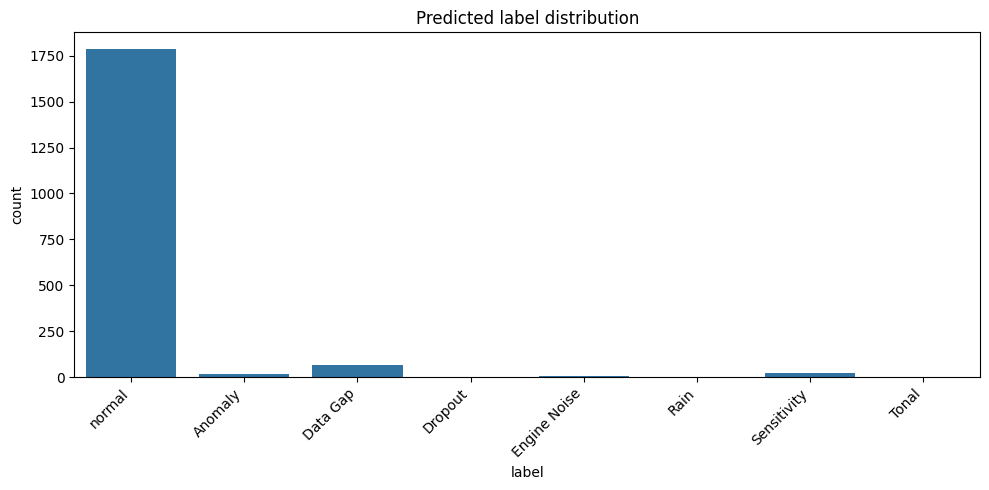

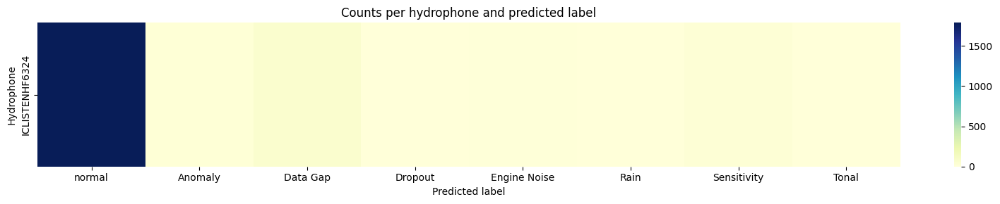

In [8]:
# Plots: label distribution and per-hydrophone breakdown (if hydrophone can be parsed from path)

# Be robust to column names: allow either 'label' or 'pred_label'
df_plot = label_counts_df.copy()
if 'label' not in df_plot.columns and 'pred_label' in df_plot.columns:
    df_plot = df_plot.rename(columns={'pred_label': 'label'})

# Ensure ordering matches class_names and fill any missing labels with zero
if 'label' in df_plot.columns and 'count' in df_plot.columns:
    df_plot = df_plot.set_index('label').reindex(class_names, fill_value=0).reset_index()

plt.figure(figsize=(10, 5))
sns.barplot(data=df_plot, x='label', y='count')
plt.title('Predicted label distribution')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Try to parse hydrophone name from filename (before first underscore)
paths_series = results['path'].astype(str)
hydros = paths_series.apply(lambda p: Path(p).name.split('_')[0] if '_' in Path(p).name else None)
results['hydrophone'] = hydros

hydro_label_counts = results.groupby(['hydrophone', 'pred_label']).size().reset_index(name='count')

# Pivot to heatmap
pivot = hydro_label_counts.pivot(index='hydrophone', columns='pred_label', values='count').fillna(0).reindex(columns=class_names, fill_value=0)
plt.figure(figsize=(1.5*len(class_names)+4, 0.5*max(6, len(pivot.index))))
sns.heatmap(pivot, annot=False, cmap='YlGnBu')
plt.title('Counts per hydrophone and predicted label')
plt.xlabel('Predicted label')
plt.ylabel('Hydrophone')
plt.tight_layout()
plt.show()


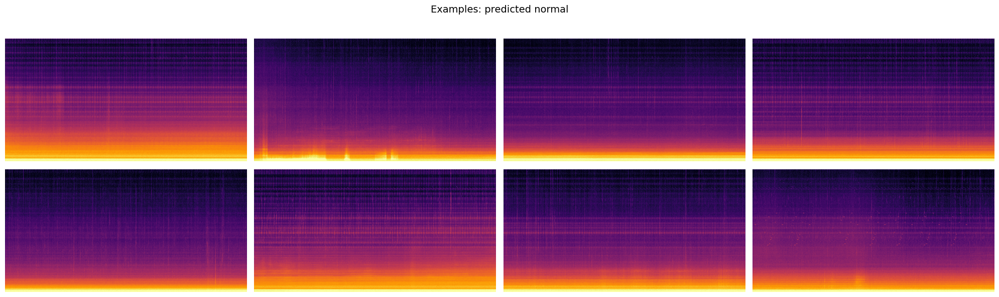

No examples for Examples: predicted Anomaly


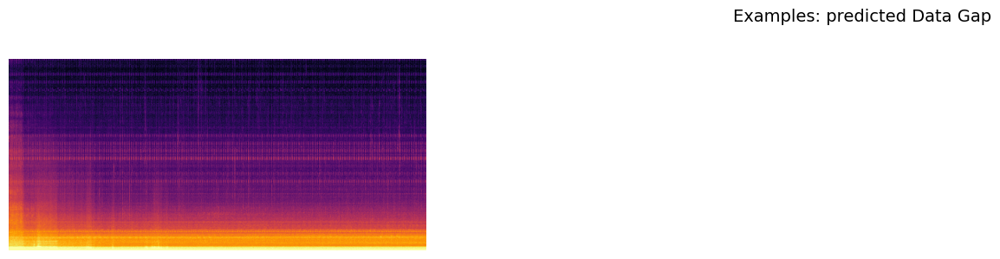

No examples for Examples: predicted Dropout


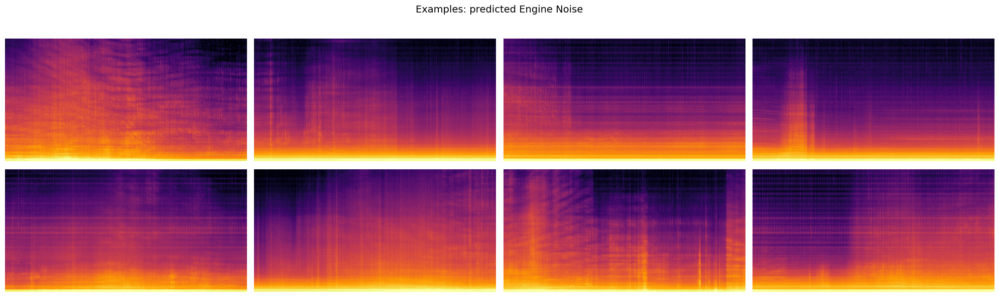

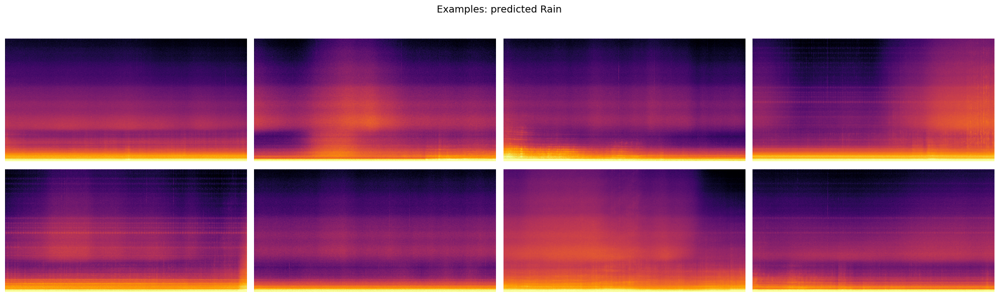

No examples for Examples: predicted Sensitivity


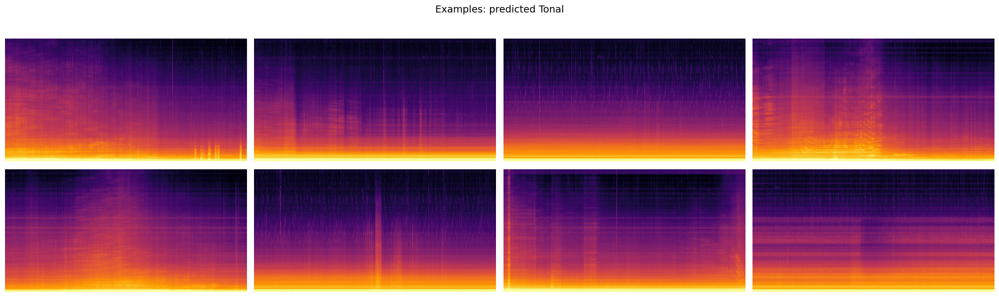

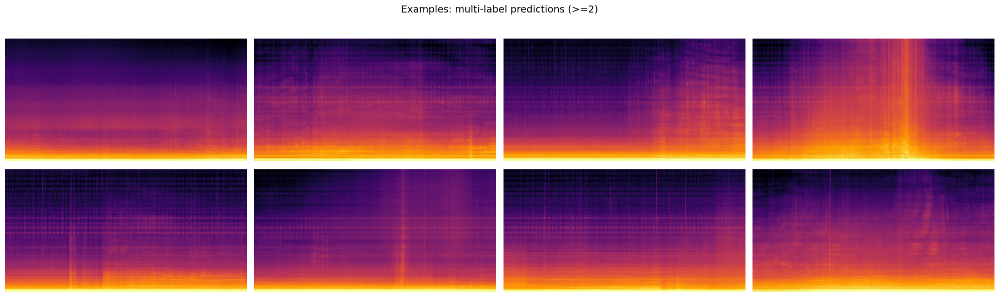

In [19]:
# Sample spectrogram grids per predicted class and multi-label cases

import random

def show_examples(paths, indices, title, k=8, samples_per_row=4):
    idxs = [i for i in indices if i < len(paths)]
    if not idxs:
        print(f"No examples for {title}")
        return
    idxs = random.sample(idxs, min(k, len(idxs)))
    rows = int(np.ceil(len(idxs) / samples_per_row))
    plt.figure(figsize=(5 * samples_per_row, 3 * rows))
    plt.suptitle(title, fontsize=14)
    for j, i in enumerate(idxs):
        plt.subplot(rows, samples_per_row, j + 1)
        arr = load_mat_spectrogram(paths[i], EXPECTED_SHAPE)
        if arr is None:
            continue
        arr = normalize_spectrogram(arr)
        arr = np.expand_dims(arr, axis=-1)
        arr = np.transpose(arr, (2, 0, 1))
        plt.imshow(arr[0], origin='lower', aspect='auto', cmap='inferno')
        plt.xlabel(Path(paths[i]).name, fontsize=7)
        plt.axis('off')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Per-class examples (using argmax label)
for c, name in enumerate(class_names):
    indices = list(np.where(preds == c)[0])
    show_examples(mat_paths, indices, f"Examples: predicted {name}")

# Multi-label examples (thresholded)
ml_idxs = list(np.where(y_pred_bin.sum(axis=1) >= 2)[0])
show_examples(mat_paths, ml_idxs, "Examples: multi-label predictions (>=2)")


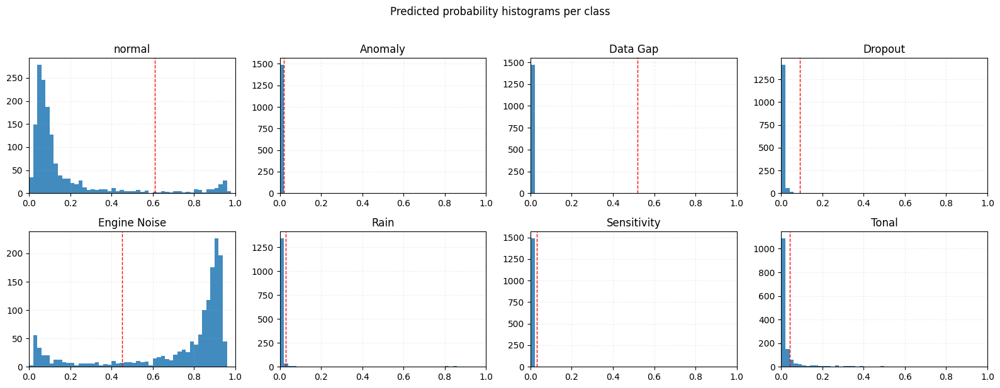

In [20]:
# Histograms of predicted probabilities per class
import math

if 'probs' not in globals():
    raise RuntimeError("'probs' not found. Run inference cell first.")

C = probs.shape[1]
cols = min(4, C)
rows = math.ceil(C / cols)
plt.figure(figsize=(4 * cols, 3 * rows))

for c in range(C):
    ax = plt.subplot(rows, cols, c + 1)
    vals = probs[:, c]
    ax.hist(vals, bins=50, range=(0.0, 1.0), alpha=0.85, color='tab:blue')
    ax.set_title(class_names[c])
    ax.set_xlim(0.0, 1.0)
    # Overlay per-class threshold if available
    if 'per_class_thresholds' in globals() and isinstance(per_class_thresholds, np.ndarray) and len(per_class_thresholds) == C:
        ax.axvline(float(per_class_thresholds[c]), color='red', linestyle='--', linewidth=1)
    ax.grid(alpha=0.2, linestyle='--')

plt.suptitle('Predicted probability histograms per class', y=1.02)
plt.tight_layout()
plt.show()


In [ ]:
# Save figures and CSV

results.to_csv(OUTPUT_DIR / 'predictions.csv', index=False)
label_counts_df.to_csv(OUTPUT_DIR / 'label_distribution.csv', index=False)

print('Saved predictions and label distribution.')


/tmp/ipykernel_21530/215738450.py:57: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


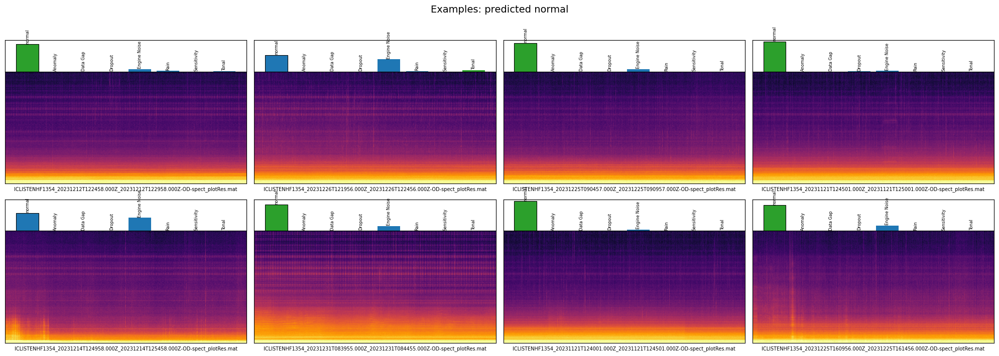

No examples for Examples: predicted Anomaly


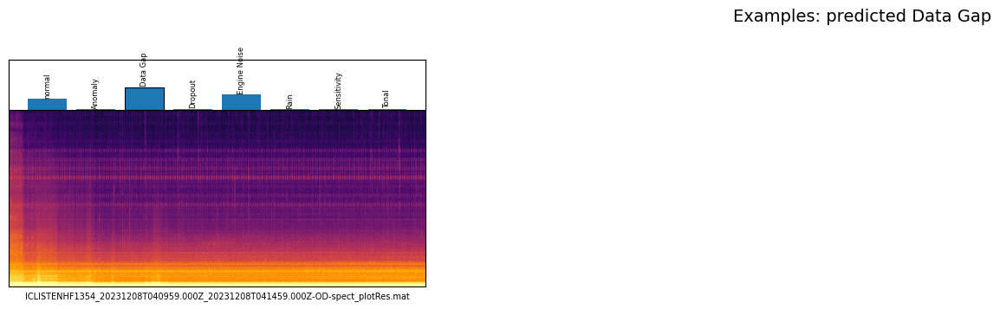

No examples for Examples: predicted Dropout


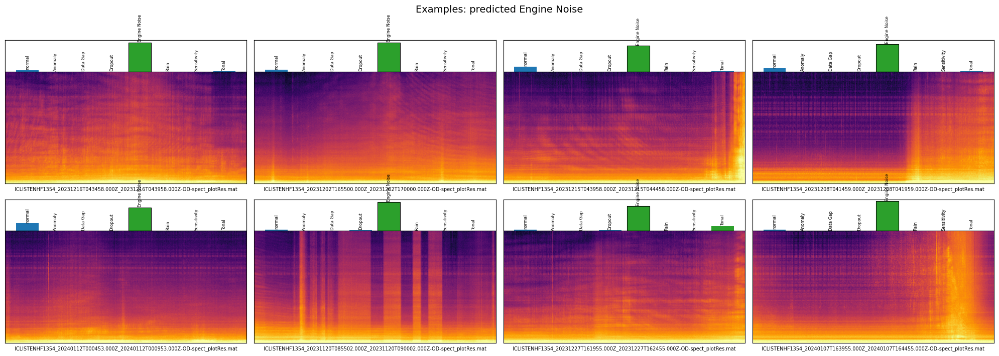

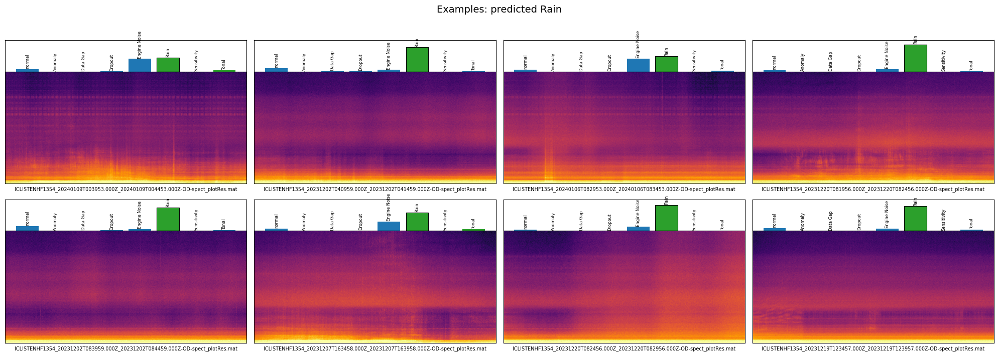

No examples for Examples: predicted Sensitivity


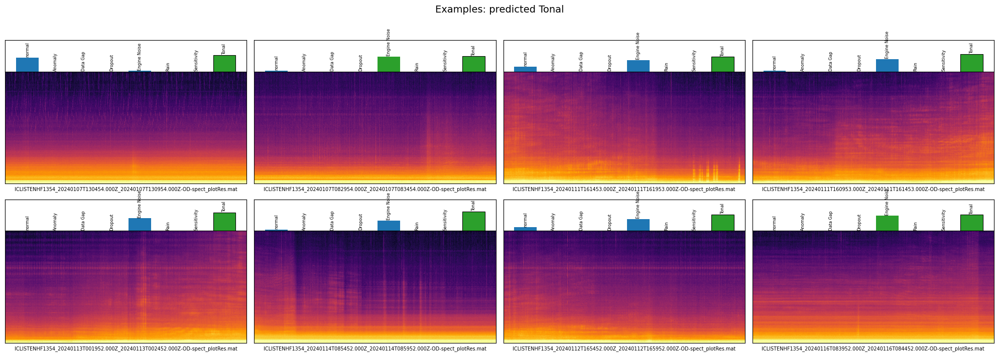

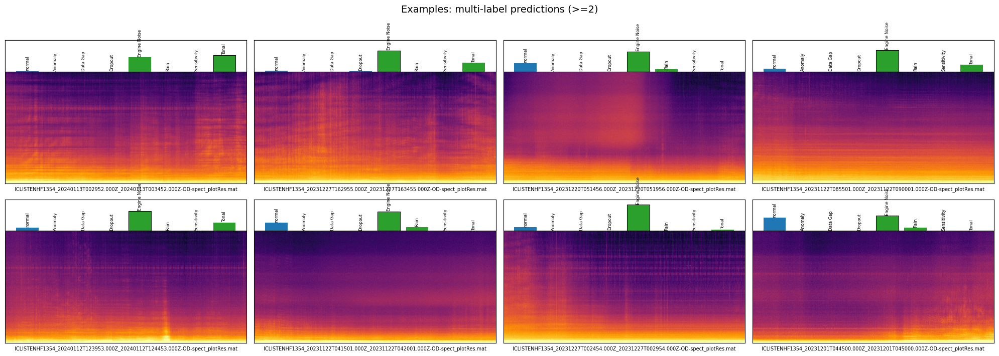

In [22]:
# Redefine show_examples to include per-class probability bars above each spectrogram
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import random

def show_examples(paths, indices, title, k=8, samples_per_row=4):
    if 'probs' not in globals() or 'class_names' not in globals():
        raise RuntimeError("'probs' and 'class_names' must be defined (run inference first)")

    idxs = [i for i in indices if 0 <= i < len(paths) and i < len(probs)]
    if not idxs:
        print(f"No examples for {title}")
        return
    idxs = random.sample(idxs, min(k, len(idxs)))
    rows = int(np.ceil(len(idxs) / samples_per_row))

    plt.figure(figsize=(5 * samples_per_row, 3.6 * rows))
    plt.suptitle(title, fontsize=14)

    for j, i in enumerate(idxs):
        ax = plt.subplot(rows, samples_per_row, j + 1)

        # Load and normalize spectrogram for display
        arr = load_mat_spectrogram(paths[i], EXPECTED_SHAPE)
        if arr is None:
            continue
        arr = normalize_spectrogram(arr)
        ax.imshow(arr, origin='lower', aspect='auto', cmap='inferno')
        ax.set_xlabel(Path(paths[i]).name, fontsize=7)
        ax.set_xticks([])
        ax.set_yticks([])

        # Inset bar chart for per-class probabilities
        iax = inset_axes(ax, width="100%", height="22%", loc='upper center',
                         bbox_to_anchor=(0.0, 0.0, 1.0, 1.0), bbox_transform=ax.transAxes, borderpad=0)
        p = probs[i]
        x_pos = np.arange(len(class_names))
        # Color bars by per-class threshold when available
        colors = ['tab:blue'] * len(class_names)
        if 'per_class_thresholds' in globals() and isinstance(per_class_thresholds, np.ndarray) and len(per_class_thresholds) == len(class_names):
            for _j, _val in enumerate(p):
                if float(_val) >= float(per_class_thresholds[_j]):
                    colors[_j] = 'tab:green'
        iax.bar(x_pos, p, color=colors)
        iax.set_ylim(0.0, 1.0)
        iax.set_xticks([])
        iax.set_yticks([])
        # Add tiny class labels above bars
        for _xi, _name, _val in zip(x_pos, class_names, p):
            iax.text(_xi, min(1.0, float(_val) + 0.02), _name, ha='center', va='bottom', fontsize=6, rotation=90)
        # Outline predicted class
        try:
            pred_idx_i = int(np.argmax(p))
            iax.bar(pred_idx_i, p[pred_idx_i], color=colors[pred_idx_i], edgecolor='black', linewidth=0.8)
        except Exception:
            pass

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Re-run example grids using the updated function
for c, name in enumerate(class_names):
    indices = list(np.where(preds == c)[0])
    show_examples(mat_paths, indices, f"Examples: predicted {name}")

ml_idxs = list(np.where(y_pred_bin.sum(axis=1) >= 2)[0])
show_examples(mat_paths, ml_idxs, "Examples: multi-label predictions (>=2)")


In [12]:
# Pipeline profiling: memory and timing from raw .mat to prediction
import os, time, psutil
from statistics import mean

# Use existing 'device' if defined; otherwise create one
DEVICE = device if 'device' in globals() else torch.device('cuda' if torch.cuda.is_available() else 'cpu')

proc = psutil.Process(os.getpid())

def bytes_to_mb(x):
    return float(x) / (1024.0 * 1024.0)

# Report model footprint (RAM + GPU)
ram_mb = bytes_to_mb(proc.memory_info().rss)
print(f"Process RSS (approx RAM in use): {ram_mb:.1f} MB")
if torch.cuda.is_available():
    torch.cuda.synchronize()
    cur_alloc = bytes_to_mb(torch.cuda.memory_allocated(DEVICE))
    cur_reserved = bytes_to_mb(torch.cuda.memory_reserved(DEVICE))
    print(f"GPU mem allocated: {cur_alloc:.1f} MB | reserved: {cur_reserved:.1f} MB")
else:
    print("GPU not available; GPU memory stats skipped.")

# Pick a few samples to profile end-to-end
if 'mat_paths' not in globals() or len(mat_paths) == 0:
    mat_paths = sorted([str(p) for p in Path(MAT_FILES_DIR).glob('**/*.mat')])

sample_paths = mat_paths[:min(10, len(mat_paths))]
print(f"Profiling {len(sample_paths)} samples using H5-like pipeline (resize -> normalize -> [C,F,T])...")

steps = ['load_mat', 'resize', 'normalize', 'to_tensor', 'forward']
step_times = {k: [] for k in steps}
forward_gpu_mem_mb = []

for pth in tqdm(sample_paths, desc='profile'):
    # Step: load .mat -> [F,T]
    t0 = time.perf_counter()
    arr = load_mat_spectrogram(pth, EXPECTED_SHAPE)
    t1 = time.perf_counter()

    # Step: resize -> TARGET_SIZE
    arr_r = resize_to_target(arr, TARGET_SIZE)
    t2 = time.perf_counter()

    # Step: normalize
    arr_n = normalize_spectrogram(
        arr_r,
        dataset_mean=getattr(args, 'dataset_mean', None),
        dataset_std=getattr(args, 'dataset_std', None),
        amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount')
    )
    t3 = time.perf_counter()

    # Step: to tensor [1,F,T] for model
    ten = preprocess_to_tensor(arr_n).unsqueeze(0).to(DEVICE)
    t4 = time.perf_counter()

    # Step: forward
    if torch.cuda.is_available():
        torch.cuda.synchronize()
        torch.cuda.reset_peak_memory_stats(DEVICE)
        before_alloc = torch.cuda.memory_allocated(DEVICE)
    t5 = time.perf_counter()
    with torch.no_grad():
        logits = model(ten, task=getattr(args, 'task', 'ft_cls'))
        _ = torch.softmax(logits, dim=1)
    if torch.cuda.is_available():
        torch.cuda.synchronize()
        after_alloc = torch.cuda.memory_allocated(DEVICE)
        peak_alloc = torch.cuda.max_memory_allocated(DEVICE)
        forward_gpu_mem_mb.append(bytes_to_mb(max(0, max(after_alloc, peak_alloc) - before_alloc)))
    t6 = time.perf_counter()

    # record times
    step_times['load_mat'].append(t1 - t0)
    step_times['resize'].append(t2 - t1)
    step_times['normalize'].append(t3 - t2)
    step_times['to_tensor'].append(t4 - t3)
    step_times['forward'].append(t6 - t5)

# Summary
print("\n=== Pipeline timing (mean over samples) ===")
for k in steps:
    print(f"{k:>10}: {mean(step_times[k])*1000:.2f} ms")

if torch.cuda.is_available() and forward_gpu_mem_mb:
    print(f"\nApprox GPU mem per forward (delta/peak): {mean(forward_gpu_mem_mb):.2f} MB")

print("\nNote: RAM/GPU numbers are approximate and environment-dependent.")


Process RSS (approx RAM in use): 1995.6 MB
GPU mem allocated: 1424.0 MB | reserved: 2316.0 MB
Profiling 10 samples using H5-like pipeline (resize -> normalize -> [C,F,T])...


profile: 100%|██████████| 10/10 [00:38<00:00,  3.80s/it]


=== Pipeline timing (mean over samples) ===
  load_mat: 3529.69 ms
    resize: 2.87 ms
 normalize: 0.62 ms
 to_tensor: 1.13 ms
   forward: 269.20 ms

Approx GPU mem per forward (delta/peak): 171.45 MB

Note: RAM/GPU numbers are approximate and environment-dependent.


In [7]:
# Benchmark multiple inference configurations (throughput and total time)
import itertools, time
from statistics import mean
from collections import OrderedDict
from src.ssamba.utilities.inference_utils import build_mat_dataloader_h5like

# Reuse existing device
DEVICE = device if 'device' in globals() else torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Sample a manageable subset for timing
if 'mat_paths' not in globals() or len(mat_paths) == 0:
    mat_paths = sorted([str(p) for p in Path(MAT_FILES_DIR).glob('**/*.mat')])
bench_paths = mat_paths[:min(200, len(mat_paths))]
print(f"Benchmarking on {len(bench_paths)} files")

modes = ['h5_like', 'mat_like']          # preprocessing order
use_amps = [False, True] if torch.cuda.is_available() else [False]
batch_sizes = [8, 32]
workers = [0, 4]
pins = [True]

results = []
for mode, amp, bs, nw, pin in itertools.product(modes, use_amps, batch_sizes, workers, pins):
    # Build dataloader per mode
    if mode == 'h5_like':
        dl = build_mat_dataloader_h5like(
            paths=bench_paths,
            expected_shape=EXPECTED_SHAPE,
            target_size=TARGET_SIZE,
            batch_size=bs,
            num_workers=nw,
            dataset_mean=getattr(args, 'dataset_mean', None),
            dataset_std=getattr(args, 'dataset_std', None),
            amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount'),
            pin_memory=pin,
        )
    else:  # mat_like: normalize -> resize -> [1,T,F]
        dl = build_mat_dataloader(
            paths=bench_paths,
            expected_shape=EXPECTED_SHAPE,
            target_size=TARGET_SIZE,
            batch_size=bs,
            num_workers=nw,
            dataset_mean=getattr(args, 'dataset_mean', None),
            dataset_std=getattr(args, 'dataset_std', None),
            amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount'),
            pin_memory=pin,
        )

    # Time inference
    torch.cuda.synchronize() if torch.cuda.is_available() else None
    t0 = time.perf_counter()
    _y, _pidx, _probs, _src = run_inference_multiclass(
        model=model,
        data_loader=dl,
        device=DEVICE,
        task=getattr(args, 'task', 'ft_cls'),
        show_progress=False,
        desc=f"bench-{mode}",
        use_amp=amp,
    )
    torch.cuda.synchronize() if torch.cuda.is_available() else None
    dt = time.perf_counter() - t0

    results.append(OrderedDict(
        mode=mode,
        amp=amp,
        batch_size=bs,
        workers=nw,
        pin_memory=pin,
        total_s=dt,
        throughput_fps=len(bench_paths)/dt if dt>0 else float('inf'),
    ))

# Print sorted summary by total time
results_sorted = sorted(results, key=lambda r: r['total_s'])
print("\n=== Inference configuration benchmark (sorted by total time) ===")
for r in results_sorted:
    print(f"mode={r['mode']:<7} amp={str(r['amp']):<5} bs={r['batch_size']:<3} workers={r['workers']:<2} pin={str(r['pin_memory']):<5} | total={r['total_s']:.2f}s, fps={r['throughput_fps']:.1f}")


Benchmarking on 200 files


/home/sbialek/ONC/selfsupervision_anomalies_onc/src/ssamba/utilities/inference_utils.py:296: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():



=== Inference configuration benchmark (sorted by total time) ===
mode=mat_like amp=True  bs=8   workers=4  pin=True  | total=137.86s, fps=1.5
mode=h5_like amp=True  bs=8   workers=4  pin=True  | total=143.10s, fps=1.4
mode=mat_like amp=False bs=8   workers=4  pin=True  | total=144.26s, fps=1.4
mode=mat_like amp=True  bs=32  workers=4  pin=True  | total=148.89s, fps=1.3
mode=h5_like amp=False bs=32  workers=4  pin=True  | total=157.23s, fps=1.3
mode=h5_like amp=True  bs=32  workers=4  pin=True  | total=157.55s, fps=1.3
mode=mat_like amp=False bs=32  workers=4  pin=True  | total=163.53s, fps=1.2
mode=h5_like amp=False bs=8   workers=4  pin=True  | total=204.51s, fps=1.0
mode=mat_like amp=True  bs=32  workers=0  pin=True  | total=554.66s, fps=0.4
mode=h5_like amp=True  bs=32  workers=0  pin=True  | total=574.61s, fps=0.3
mode=mat_like amp=True  bs=8   workers=0  pin=True  | total=577.64s, fps=0.3
mode=mat_like amp=False bs=8   workers=0  pin=True  | total=578.09s, fps=0.3
mode=h5_like am

In [8]:
# Re-test end-to-end timing + memory using the fastest benchmarked configuration
import time, psutil
from collections import OrderedDict

# Pick best config from the previous benchmark results if available
if 'results_sorted' in globals() and len(results_sorted) > 0:
    best = results_sorted[0]
    mode = best['mode']
    amp = best['amp']
    bs = int(best['batch_size'])
    nw = int(best['workers'])
    pin = bool(best['pin_memory'])
else:
    # Sensible defaults if no benchmark run yet
    mode = 'mat_like'
    amp = torch.cuda.is_available()
    bs = 32
    nw = 4
    pin = True

print('Chosen config:', dict(mode=mode, amp=amp, batch_size=bs, workers=nw, pin_memory=pin))

# Build dataloader for full run (use bench_paths if defined, else mat_paths)
if 'bench_paths' in globals() and len(bench_paths) > 0:
    run_paths = bench_paths
elif 'mat_paths' in globals() and len(mat_paths) > 0:
    run_paths = mat_paths
else:
    run_paths = sorted([str(p) for p in Path(MAT_FILES_DIR).glob('**/*.mat')])

if mode == 'h5_like':
    dl = build_mat_dataloader_h5like(
        paths=run_paths,
        expected_shape=EXPECTED_SHAPE,
        target_size=TARGET_SIZE,
        batch_size=bs,
        num_workers=nw,
        dataset_mean=getattr(args, 'dataset_mean', None),
        dataset_std=getattr(args, 'dataset_std', None),
        amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount'),
        pin_memory=pin,
    )
else:
    dl = build_mat_dataloader(
        paths=run_paths,
        expected_shape=EXPECTED_SHAPE,
        target_size=TARGET_SIZE,
        batch_size=bs,
        num_workers=nw,
        dataset_mean=getattr(args, 'dataset_mean', None),
        dataset_std=getattr(args, 'dataset_std', None),
        amount=1.0 if getattr(args, 'amount', None) is None else getattr(args, 'amount'),
        pin_memory=pin,
    )

# Memory before run
proc = psutil.Process(os.getpid())
ram_before_mb = proc.memory_info().rss / (1024*1024)
if torch.cuda.is_available():
    torch.cuda.synchronize()
    torch.cuda.reset_peak_memory_stats(DEVICE)
    gpu_alloc_before_mb = torch.cuda.memory_allocated(DEVICE) / (1024*1024)
    gpu_res_before_mb = torch.cuda.memory_reserved(DEVICE) / (1024*1024)

# Time full inference
torch.cuda.synchronize() if torch.cuda.is_available() else None
t0 = time.perf_counter()
_yt, _yp, _yprobs, _src = run_inference_multiclass(
    model=model,
    data_loader=dl,
    device=DEVICE,
    task=getattr(args, 'task', 'ft_cls'),
    show_progress=True,
    desc='full-retest',
    use_amp=amp,
)
t_total = time.perf_counter() - t0
torch.cuda.synchronize() if torch.cuda.is_available() else None

# Memory after run
ram_after_mb = proc.memory_info().rss / (1024*1024)
if torch.cuda.is_available():
    gpu_alloc_after_mb = torch.cuda.memory_allocated(DEVICE) / (1024*1024)
    gpu_res_after_mb = torch.cuda.memory_reserved(DEVICE) / (1024*1024)
    gpu_peak_mb = torch.cuda.max_memory_allocated(DEVICE) / (1024*1024)

# Report
n = len(run_paths)
print('\n=== Full pipeline re-test ===')
print(f"Files: {n} | total time: {t_total:.2f}s | throughput: {n/t_total:.2f} files/s")
print(f"RAM before: {ram_before_mb:.1f} MB | after: {ram_after_mb:.1f} MB | delta: {ram_after_mb-ram_before_mb:.1f} MB")
if torch.cuda.is_available():
    print(f"GPU alloc before/after: {gpu_alloc_before_mb:.1f} / {gpu_alloc_after_mb:.1f} MB")
    print(f"GPU reserved before/after: {gpu_res_before_mb:.1f} / {gpu_res_after_mb:.1f} MB")
    print(f"GPU peak allocated during run: {gpu_peak_mb:.1f} MB")


Chosen config: {'mode': 'mat_like', 'amp': True, 'batch_size': 8, 'workers': 4, 'pin_memory': True}


full-retest:   0%|          | 0/25 [00:00<?, ?batch/s]


=== Full pipeline re-test ===
Files: 200 | total time: 215.57s | throughput: 0.93 files/s
RAM before: 2150.8 MB | after: 2151.1 MB | delta: 0.3 MB
GPU alloc before/after: 1424.0 / 1424.0 MB
GPU reserved before/after: 8420.0 / 8420.0 MB
GPU peak allocated during run: 2432.8 MB


In [9]:
# Estimate for one ONC day (27 hydrophones, 5-min bins)
per_hydro_per_day = int((24 * 60) / 5)  # 288
total_day_files = 27 * per_hydro_per_day  # 7776
throughput = n / t_total if t_total > 0 else float('inf')
if np.isfinite(throughput) and throughput > 0:
    seconds_needed = total_day_files / throughput
    h = int(seconds_needed // 3600)
    m = int((seconds_needed % 3600) // 60)
    s = int(seconds_needed % 60)
    print(f"\nEstimated 1-day runtime (27 hydros, 5-min): ~ {h}h {m}m {s}s at {throughput:.2f} files/s")
else:
    print("\nCannot estimate daily runtime: invalid throughput.")


Estimated 1-day runtime (27 hydros, 5-min): ~ 2h 19m 41s at 0.93 files/s
